# Gene program visualisation analyses

In [1]:
suppressPackageStartupMessages({
  library(Seurat)
  library(tidyverse)
  library(patchwork)
  library(cowplot)
  library(ComplexHeatmap)
})

# Helper functions

In [2]:
source("../scripts/plotting.R")

# Load data

### Filtered dataset

QS object generated by running notebooks in `03_annotate`

In [ ]:
seu <- qs::qread(file = "../data/processed/cite_seq/cohort_treatment_naive/annotated/annotated.qs", nthreads = getOption("hpc.ncpus", 1))

In [4]:
object.size(seu) %>% format(unit = "Gb")

[1] "27 Gb"

In [5]:
seu

An object of class Seurat 
26712 features across 264512 samples within 3 assays 
Active assay: RNA (26424 features, 4993 variable features)
 3 layers present: data, counts, scale.data
 2 other assays present: ADT, ADTC
 5 dimensional reductions calculated: pca, integrated.rna, apca, integrated.adt, umap

### GEP usages

In [ ]:
gep.usage <- set_names(c("B", "DC", "Mono", "NK", "T")) %>%
  map(
    .f = function(x) {
      mat <- read_tsv(
        file = glue::glue("../results/tables/cite_seq/cohort_treatment_naive/gep/{x}/finalised/usage.tsv"),
        col_names = TRUE,
        show_col_types = FALSE
      ) %>%
        column_to_rownames("...1") %>%
        as.matrix()
      labels <- yaml::read_yaml(glue::glue("../results/tables/cite_seq/cohort_treatment_naive/gep/{x}/finalised/module_labels.yaml"))
      colnames(mat) <- labels[colnames(mat)]
      return(t(mat))
    }
  )

New names:
* `` -> `...1`
New names:
* `` -> `...1`
New names:
* `` -> `...1`
New names:
* `` -> `...1`
New names:
* `` -> `...1`


### Top genes

In [ ]:
gep.topgenes <- set_names(c("B", "DC", "Mono", "NK", "T")) %>%
  map(
    .f = function(x) {
      df <- read_tsv(
        file = glue::glue("../results/tables/cite_seq/cohort_treatment_naive/gep/{x}/finalised/topgenes.tsv"),
        col_names = TRUE,
        show_col_types = FALSE
      )
      labels <- yaml::read_yaml(glue::glue("../results/tables/cite_seq/cohort_treatment_naive/gep/{x}/finalised/module_labels.yaml"))
      colnames(df) <- labels[colnames(df)]
      return(df)
    }
  )

In [ ]:
openxlsx::write.xlsx(
  x = gep.topgenes,
  file = "../results/tables/cite_seq/cohort_treatment_naive/gep/top_genes.xlsx",
  asTable = FALSE,
  overwrite = TRUE
)

# Custom colour palettes

In [7]:
cluster.main.pal <- c(
  B = pals::brewer.reds(100)[90],
  DC = pals::brewer.greys(100)[90],
  Mono = pals::brewer.purples(100)[90],
  ILC = pals::brewer.oranges(100)[50],
  NK = pals::brewer.blues(100)[90],
  T = pals::brewer.greens(100)[90]
)

In [8]:
cluster.coarse.pal <- c(
  B_naive = pals::brewer.reds(5)[3],
  B_memory = pals::brewer.reds(5)[2],
  B_plasma = pals::brewer.reds(5)[4],
  DC_AXL_SIGLEC6 = pals::brewer.greys(5)[3],
  DC_conventional = pals::brewer.greys(5)[2],
  DC_plasmacytoid = pals::brewer.greys(5)[4],
  ILC = pals::brewer.oranges(100)[50],
  Mono_CD14 = pals::brewer.purples(5)[2],
  Mono_CD16 = pals::brewer.purples(5)[4],
  NK_CD56dim = pals::brewer.blues(5)[4],
  NK_CD56bright = pals::brewer.blues(5)[2],
  T_CD4_naive = pals::brewer.greens(10)[2],
  T_CD4_memory = pals::brewer.greens(10)[7],
  T_regulatory_naive = pals::brewer.greens(10)[5],
  T_regulatory_memory = pals::brewer.greens(10)[9],
  T_CD8_naive = pals::brewer.greens(10)[10],
  T_CD8_memory = pals::brewer.greens(10)[6],
  T_MAIT = pals::brewer.greens(10)[4],
  T_GD = pals::brewer.greens(10)[8],
  T_DN = pals::brewer.greens(10)[3]
)

In [9]:
cluster.pal <- c(cluster.main.pal, cluster.coarse.pal)

# B cells

In [33]:
# Subset to B cells only
sub <- subset(seu, subset = cluster_main == "B")
Idents(sub) <- "cluster_fine"

In [34]:
sub[["GEP"]] <- CreateAssayObject(data = gep.usage[["B"]])

Warning message:
"Layer counts isn't present in the assay object; returning NULL"


### Compute UMAP projection

In [35]:
sub <- sub %>%
  RunUMAP(
    reduction = "integrated.rna",
    dims = 1:50,
    metric = "cosine",
    n.neighbors = 30L,
    min.dist = 0.3,
    spread = 1,
    n.epochs = 200L
  )

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
12:25:14 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

12:25:14 Read 7496 rows and found 50 numeric columns

12:25:14 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

12:25:14 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*


*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:25:15 Writing NN index file to temp file /tmp/RtmpjhACBG/file331ff414922928

12:25:15 Searching Annoy index using 1 thread, search_k = 3000

12:25:17 Annoy recall = 100%

12:25:18 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

12:25:20 Initializing from normalized Laplacian + noise (using RSpectra)

12:25:20 Commencing optimization for 200 epochs, with 328222 positive edges

12:25:24 Optimization finished



### Visualise GEP usage

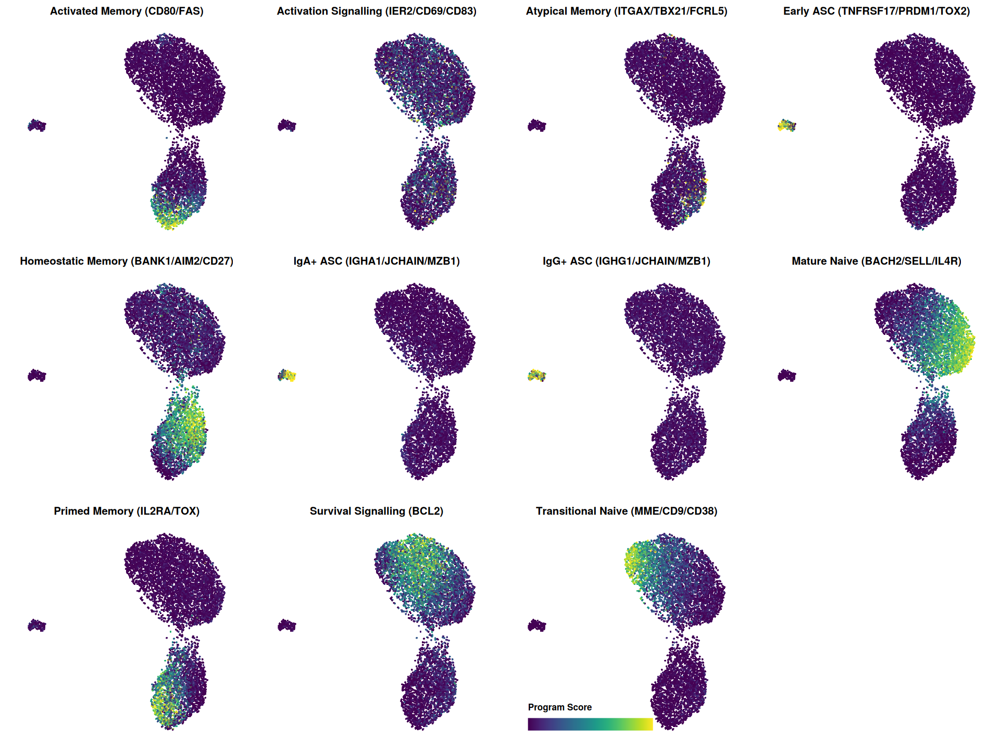

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 12)

plots <- expression.plot(
  sub,
  features = grep(pattern = "Housekeeping|Contamination|Artefactual", x = Features(sub[["GEP"]]), invert = TRUE, value = TRUE),
  assay = "GEP",
  verbose = FALSE,
  cmap = pals::viridis(100),
  limits = c(NA, "p99"),
  rasterise = TRUE,
  size.adj = 10,
  alpha = 1,
  pixels = c(2048, 2048)
) %>%
  lapply(
    function(x) {
      x +
        labs(colour = "Program Score") +
        theme(
          panel.border = element_blank(),
          axis.title = element_blank(),
          plot.title = element_text(size = 12, face = "bold", hjust = 0.5),
          legend.position = "none"
        )
    }
  )

plots <- plots[order(names(plots))]

plots[[length(plots)]] <- plots[[length(plots)]] +
  guides(
    color = guide_colorbar(direction = "horizontal", title.position = "top", barwidth = 10, barheight = 1, draw.ulim = FALSE, draw.llim = FALSE)
  ) +
  inset.legend(location = "bottomleft") +
  theme(
    legend.ticks = element_blank(),
    legend.title = element_text(size = 10, face = "bold"),
    legend.text.position = "bottom"
  )

combined <- cowplot::plot_grid(plotlist = plots, ncol = 4)

combined

ggsave(
  plot = combined,
  filename = "../results/plots/b_gep_umap.pdf",
  width = 16,
  height = 12,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

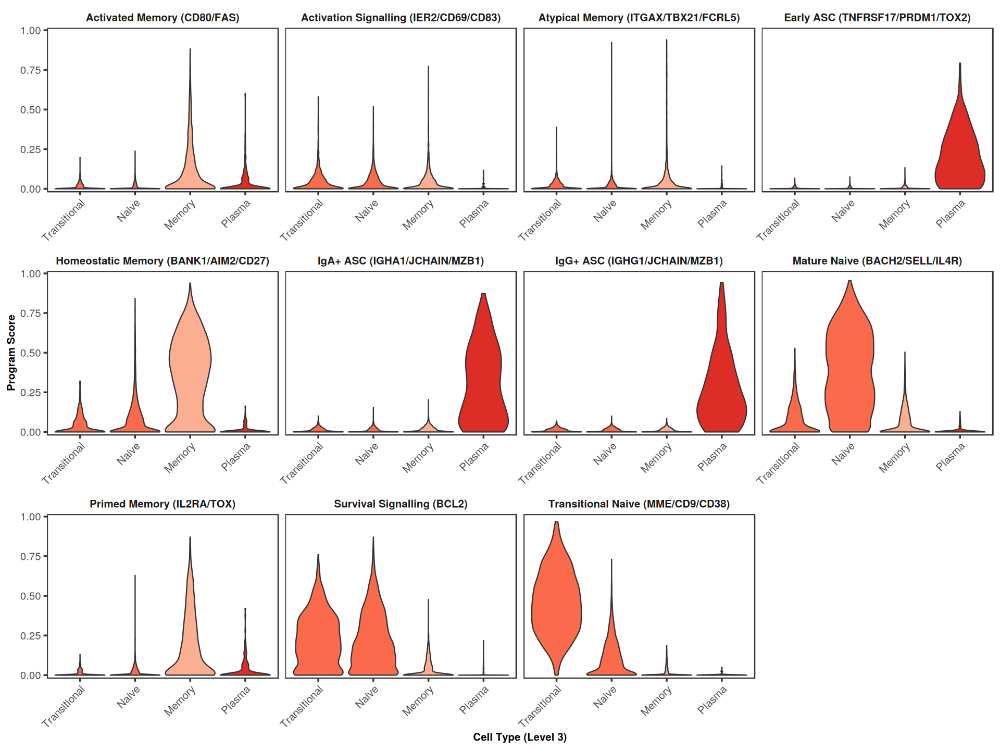

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 12)

data <- FetchData(sub, vars = c("donor", "cluster_coarse", "cluster_fine", paste0("gep_", Features(sub[["GEP"]])))) %>%
  rename_with(.cols = starts_with("gep_"), .fn = ~ gsub("gep_", "", .x)) %>%
  pivot_longer(cols = all_of(Features(sub[["GEP"]])), names_to = "gep", values_to = "usage") %>%
  filter(!grepl(pattern = "Housekeeping|Contamination|Artefactual", x = gep))

ggplot(data, aes(x = cluster_fine, y = usage, fill = cluster_coarse)) +
  geom_violin(scale = "width", alpha = 1) +
  facet_wrap(~gep, ncol = 4, scales = "free_x") +
  scale_fill_manual(values = cluster.pal) +
  scale_x_discrete(
    labels = function(x) {
      parse(
        text = case_match(
          x,
          "B_naive_transitional" ~ "Transitional",
          "B_naive" ~ "Naive",
          "B_memory" ~ "Memory",
          "B_plasma" ~ "Plasma"
        )
      )
    }
  ) +
  scale_y_continuous(expand = expansion(mult = c(0.02, 0.05))) +
  labs(
    x = "Cell Type (Level 3)",
    y = "Program Score"
  ) +
  theme_custom() +
  theme(
    strip.background = element_blank(),
    strip.text = element_text(size = 12, face = "bold"),
    axis.title = element_text(size = 12, face = "bold"),
    axis.text.x = element_text(size = 12, angle = 45, hjust = 1, vjust = 1),
    axis.text.y = element_text(size = 12),
    legend.position = "none",
  )

ggsave(
  filename = "../results/plots/b_gep_violin.pdf",
  width = 16,
  height = 12,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

### GEP co-expression

Removing 4 isolated nodes with no connections above threshold

Network contains 7 nodes and 4 edges



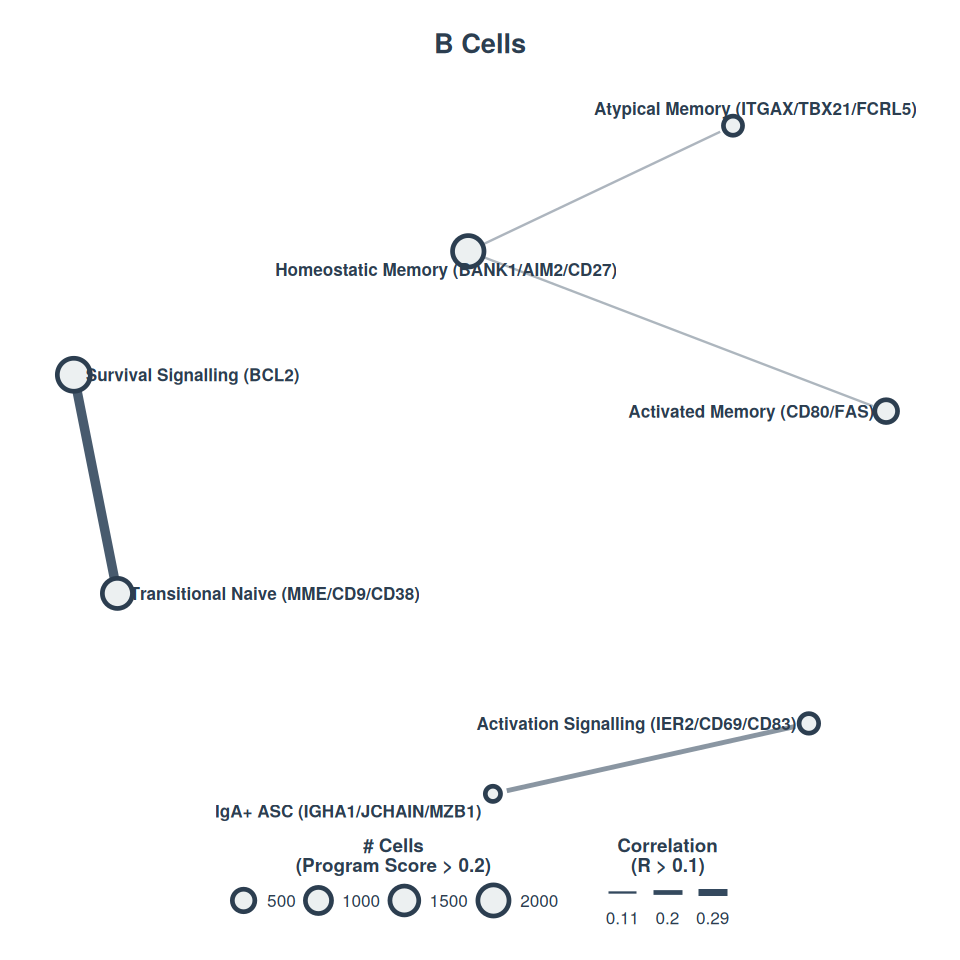

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

data <- t(GetAssayData(sub, assay = "GEP", layer = "data"))[, !grepl(pattern = "Housekeeping|Contamination|Artefactual", x = rownames(GetAssayData(sub, assay = "GEP", layer = "data")))]

set.seed(42)

gep.network.plot(
  data = data,
  usage.threshold = 0.2,
  min.correlation = 0.1,
  labs = list(title = "B Cells")
)$plot

ggsave(
  filename = "../results/plots/b_gep_network.pdf",
  width = 8,
  height = 8,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

## Dendritic cells

In [ ]:
# Subset to T cells only
sub <- subset(seu, subset = cluster_main == "DC")
Idents(sub) <- "cluster_fine"

In [ ]:
sub[["GEP"]] <- CreateAssayObject(data = gep.usage[["DC"]])

Warning message:
"Layer counts isn't present in the assay object; returning NULL"


### Compute UMAP projection

In [ ]:
sub <- sub %>%
  RunUMAP(
    reduction = "integrated.rna",
    dims = 1:50,
    metric = "cosine",
    n.neighbors = 30L,
    min.dist = 0.3,
    spread = 1,
    n.epochs = 200L
  )

12:47:49 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

12:47:49 Read 6659 rows and found 50 numeric columns

12:47:49 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

12:47:49 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*


*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:47:50 Writing NN index file to temp file /tmp/RtmpjhACBG/file331ff4115a5609

12:47:50 Searching Annoy index using 1 thread, search_k = 3000

12:47:52 Annoy recall = 100%

12:47:55 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

12:47:56 Initializing from normalized Laplacian + noise (using RSpectra)

12:47:57 Commencing optimization for 200 epochs, with 302962 positive edges

12:48:00 Optimization finished



### Visualise GEP usage

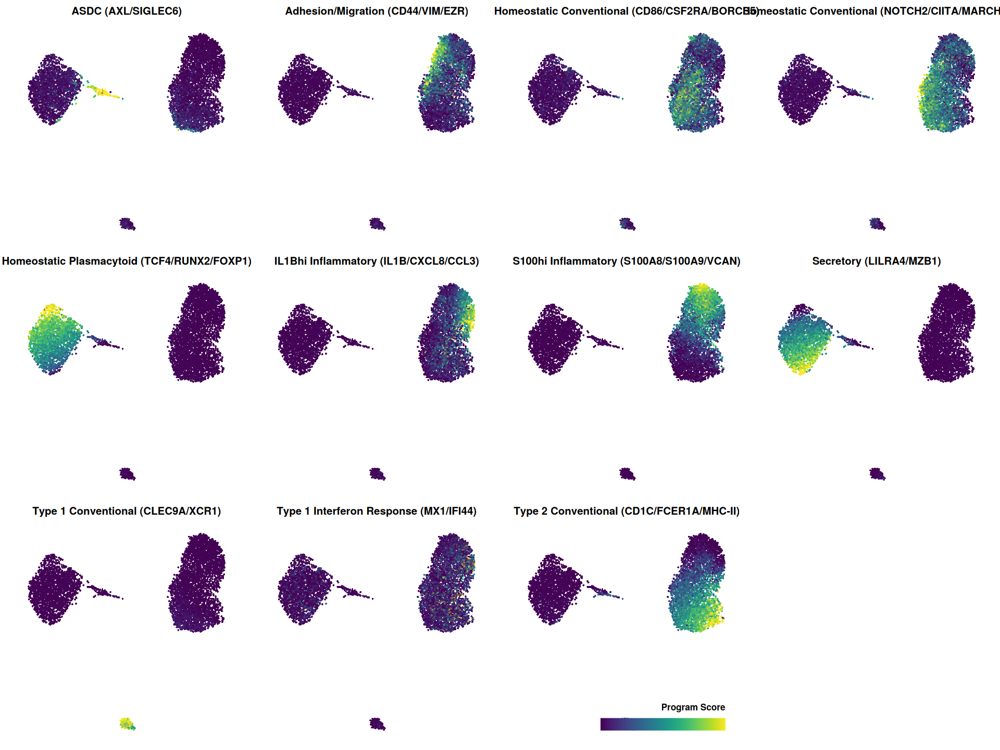

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 12)

plots <- expression.plot(
  sub,
  features = grep(pattern = "Housekeeping|Contamination|Artefactual", x = Features(sub[["GEP"]]), invert = TRUE, value = TRUE),
  assay = "GEP",
  verbose = FALSE,
  cmap = pals::viridis(100),
  limits = c(NA, "p99"),
  rasterise = TRUE,
  size.adj = 10,
  alpha = 1,
  pixels = c(2048, 2048)
) %>%
  lapply(
    function(x) {
      x +
        labs(colour = "Program Score") +
        theme(
          panel.border = element_blank(),
          axis.title = element_blank(),
          plot.title = element_text(size = 12, face = "bold", hjust = 0.5),
          legend.position = "none"
        )
    }
  )

plots <- plots[order(names(plots))]

plots[[length(plots)]] <- plots[[length(plots)]] +
  guides(
    color = guide_colorbar(direction = "horizontal", title.position = "top", barwidth = 10, barheight = 1, draw.ulim = FALSE, draw.llim = FALSE)
  ) +
  inset.legend(location = "bottomright") +
  theme(
    legend.ticks = element_blank(),
    legend.title = element_text(size = 10, face = "bold"),
    legend.text.position = "bottom"
  )

combined <- cowplot::plot_grid(plotlist = plots, ncol = 4)

combined

ggsave(
  plot = combined,
  filename = "../results/plots/dc_gep_umap.pdf",
  width = 16,
  height = 12,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

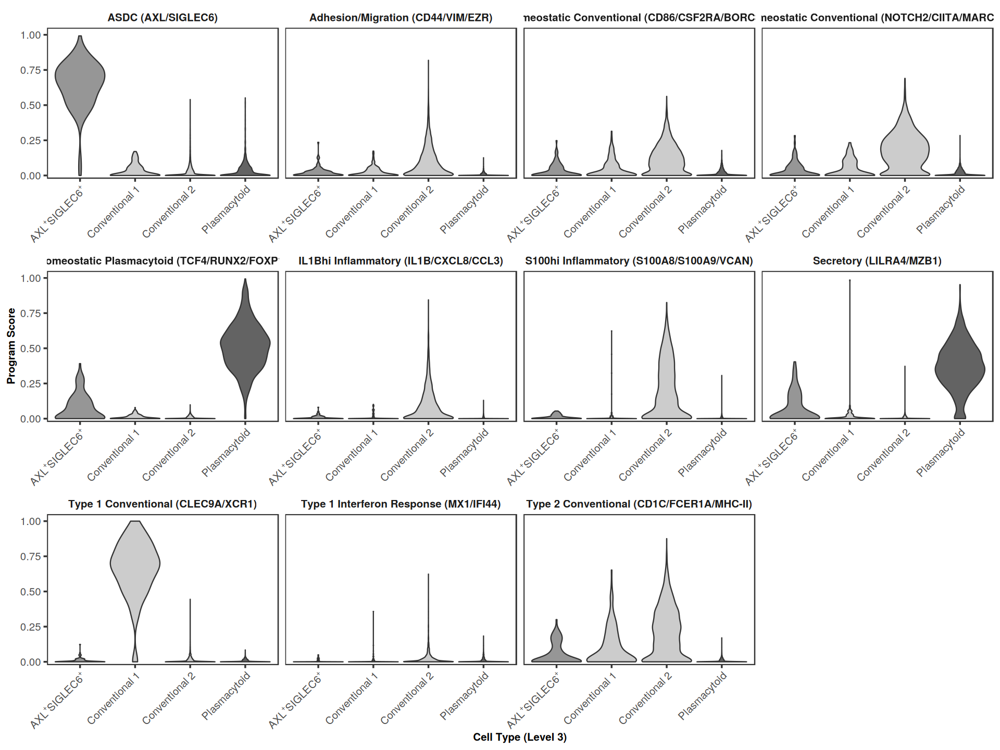

In [82]:
options(repr.plot.width = 16, repr.plot.height = 12)

data <- FetchData(sub, vars = c("donor", "cluster_coarse", "cluster_fine", paste0("gep_", Features(sub[["GEP"]])))) %>%
  rename_with(.cols = starts_with("gep_"), .fn = ~ gsub("gep_", "", .x)) %>%
  pivot_longer(cols = all_of(Features(sub[["GEP"]])), names_to = "gep", values_to = "usage") %>%
  filter(!grepl(pattern = "Housekeeping|Contamination|Artefactual", x = gep))

ggplot(data, aes(x = cluster_fine, y = usage, fill = cluster_coarse)) +
  geom_violin(scale = "width", alpha = 1) +
  facet_wrap(~gep, ncol = 4, scales = "free_x") +
  scale_fill_manual(values = cluster.pal) +
  scale_x_discrete(
    labels = function(x) {
      parse(
        text = case_match(
          x,
          "DC_AXL_SIGLEC6" ~ "AXL^'+'*SIGLEC6^'+'",
          "DC_conventional_1" ~ "Conventional~1",
          "DC_conventional_2" ~ "Conventional~2",
          "DC_plasmacytoid" ~ "Plasmacytoid"
        )
      )
    }
  ) +
  scale_y_continuous(expand = expansion(mult = c(0.02, 0.05))) +
  labs(
    x = "Cell Type (Level 3)",
    y = "Program Score"
  ) +
  theme_custom() +
  theme(
    strip.background = element_blank(),
    strip.text = element_text(size = 12, face = "bold"),
    axis.title = element_text(size = 12, face = "bold"),
    axis.text.x = element_text(size = 12, angle = 45, hjust = 1, vjust = 1),
    axis.text.y = element_text(size = 12),
    legend.position = "none",
  )

ggsave(
  filename = "../results/plots/cite_seq/cohort_treatment_naive/harmony/paper/fig_supplementary/dc_gep_violin.pdf",
  width = 16,
  height = 12,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

### GEP co-expression

Network contains 11 nodes and 23 edges



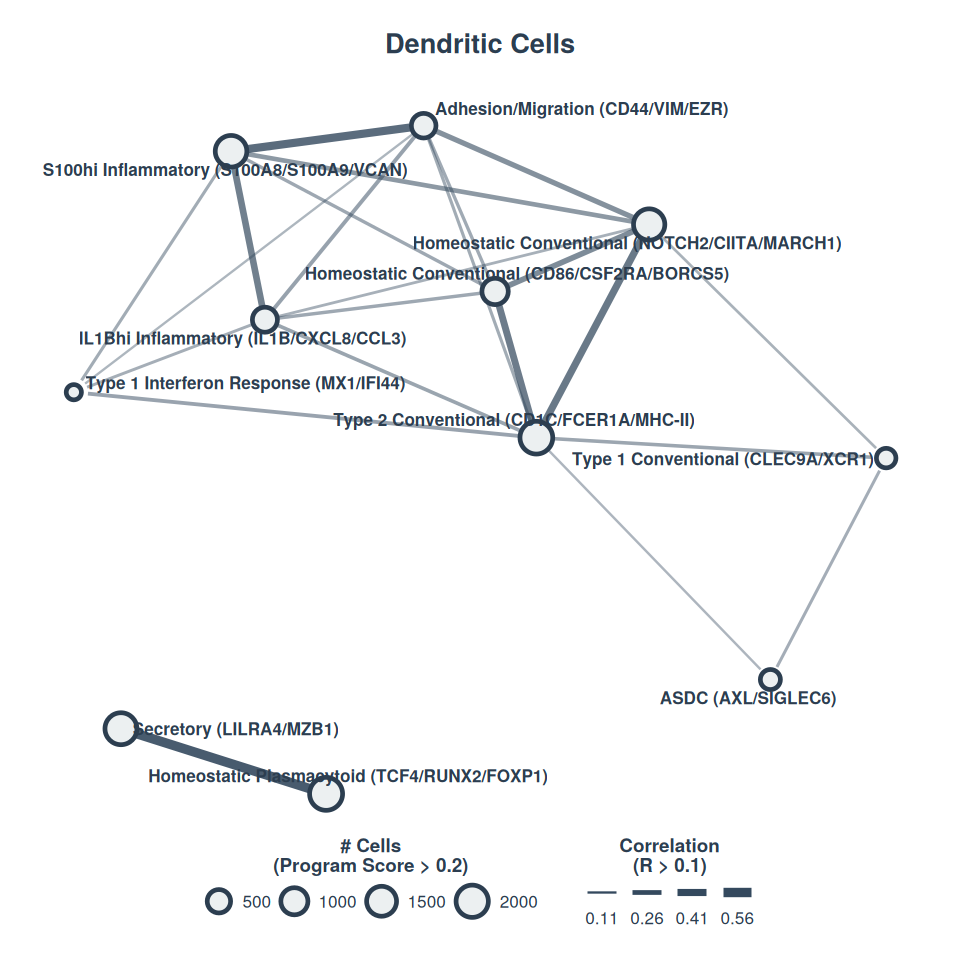

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

data <- t(GetAssayData(sub, assay = "GEP", layer = "data"))[, !grepl(pattern = "Housekeeping|Contamination|Artefactual", x = rownames(GetAssayData(sub, assay = "GEP", layer = "data")))]

set.seed(42)

gep.network.plot(
  data = data,
  usage.threshold = 0.2,
  min.correlation = 0.1,
  labs = list(title = "Dendritic Cells")
)$plot

ggsave(
  filename = "../results/plots/dc_gep_network.pdf",
  width = 8,
  height = 8,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

## Monocytes

In [10]:
# Subset to monocytes only
sub <- subset(seu, subset = cluster_main == "Mono")
Idents(sub) <- "cluster_fine"

In [11]:
sub[["GEP"]] <- CreateAssayObject(data = gep.usage[["Mono"]])

Warning message:
"Layer counts isn't present in the assay object; returning NULL"


### Compute UMAP projection

In [12]:
sub <- sub %>%
  RunUMAP(
    reduction = "integrated.rna",
    dims = 1:50,
    metric = "cosine",
    n.neighbors = 30L,
    min.dist = 0.3,
    spread = 1,
    n.epochs = 200L
  )

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
12:36:03 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

12:36:03 Read 79497 rows and found 50 numeric columns

12:36:03 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

12:36:03 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:36:11 Writing NN index file to 

### Visualise GEP usage

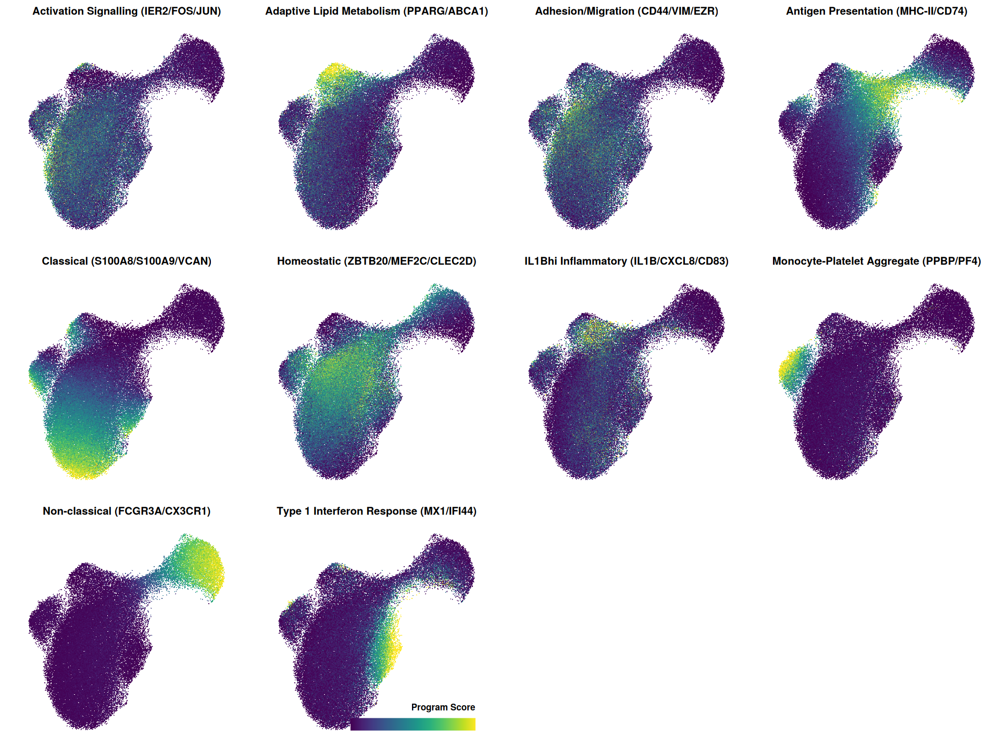

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 12)

plots <- expression.plot(
  sub,
  features = grep(pattern = "Housekeeping|Contamination|Artefactual", x = Features(sub[["GEP"]]), invert = TRUE, value = TRUE),
  assay = "GEP",
  verbose = FALSE,
  cmap = pals::viridis(100),
  limits = c(NA, "p99"),
  rasterise = TRUE,
  size.adj = 5,
  alpha = 1,
  pixels = c(2048, 2048)
) %>%
  lapply(
    function(x) {
      x +
        labs(colour = "Program Score") +
        theme(
          panel.border = element_blank(),
          axis.title = element_blank(),
          plot.title = element_text(size = 12, face = "bold", hjust = 0.5),
          legend.position = "none"
        )
    }
  )

plots <- plots[order(names(plots))]

plots[[length(plots)]] <- plots[[length(plots)]] +
  guides(
    color = guide_colorbar(direction = "horizontal", title.position = "top", barwidth = 10, barheight = 1, draw.ulim = FALSE, draw.llim = FALSE)
  ) +
  inset.legend(location = "bottomright") +
  theme(
    legend.ticks = element_blank(),
    legend.title = element_text(size = 10, face = "bold"),
    legend.text.position = "bottom"
  )

combined <- cowplot::plot_grid(plotlist = plots, ncol = 4)

combined

ggsave(
  plot = combined,
  filename = "../results/plots/mono_gep_umap.pdf",
  width = 16,
  height = 12,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

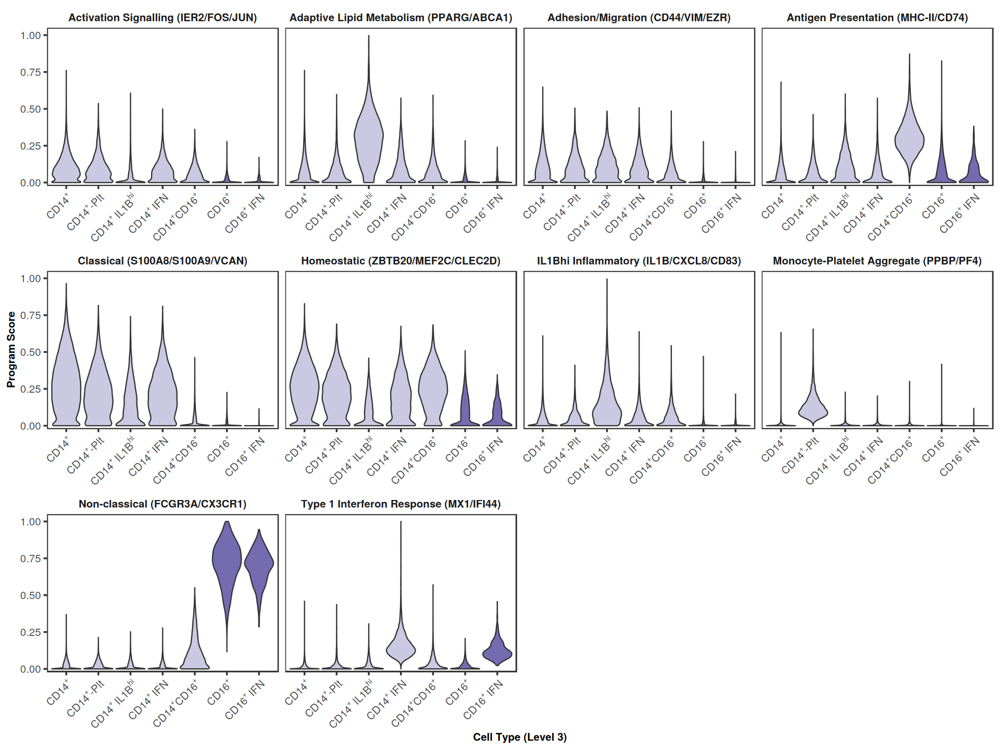

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 12)

data <- FetchData(sub, vars = c("donor", "cluster_coarse", "cluster_fine", paste0("gep_", Features(sub[["GEP"]])))) %>%
  rename_with(.cols = starts_with("gep_"), .fn = ~ gsub("gep_", "", .x)) %>%
  pivot_longer(cols = all_of(Features(sub[["GEP"]])), names_to = "gep", values_to = "usage") %>%
  filter(!grepl(pattern = "Housekeeping|Contamination|Artefactual", x = gep))

ggplot(data, aes(x = cluster_fine, y = usage, fill = cluster_coarse)) +
  geom_violin(scale = "width", alpha = 1) +
  facet_wrap(~gep, ncol = 4, scales = "free_x") +
  scale_fill_manual(values = cluster.pal) +
  scale_x_discrete(
    labels = function(x) {
      parse(
        text = case_match(
          x,
          "Mono_CD14" ~ "CD14^'+'",
          "Mono_CD14_platelet" ~ "CD14^'+'*'-'*Plt",
          "Mono_CD14_IL1B" ~ "CD14^'+'~IL1B^hi",
          "Mono_CD14_IFN" ~ "CD14^'+'~IFN",
          "Mono_CD14_CD16" ~ "CD14^'+'*CD16^'+'",
          "Mono_CD16" ~ "CD16^'+'",
          "Mono_CD16_IFN" ~ "CD16^'+'~IFN"
        )
      )
    }
  ) +
  scale_y_continuous(expand = expansion(mult = c(0.02, 0.05))) +
  labs(
    x = "Cell Type (Level 3)",
    y = "Program Score"
  ) +
  theme_custom() +
  theme(
    strip.background = element_blank(),
    strip.text = element_text(size = 12, face = "bold"),
    axis.title = element_text(size = 12, face = "bold"),
    axis.text.x = element_text(size = 12, angle = 45, hjust = 1, vjust = 1),
    axis.text.y = element_text(size = 12),
    legend.position = "none",
  )

ggsave(
  filename = "../results/plots/mono_gep_violin.pdf",
  width = 16,
  height = 12,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

### GEP co-expression

Removing 2 isolated nodes with no connections above threshold

Network contains 8 nodes and 7 edges



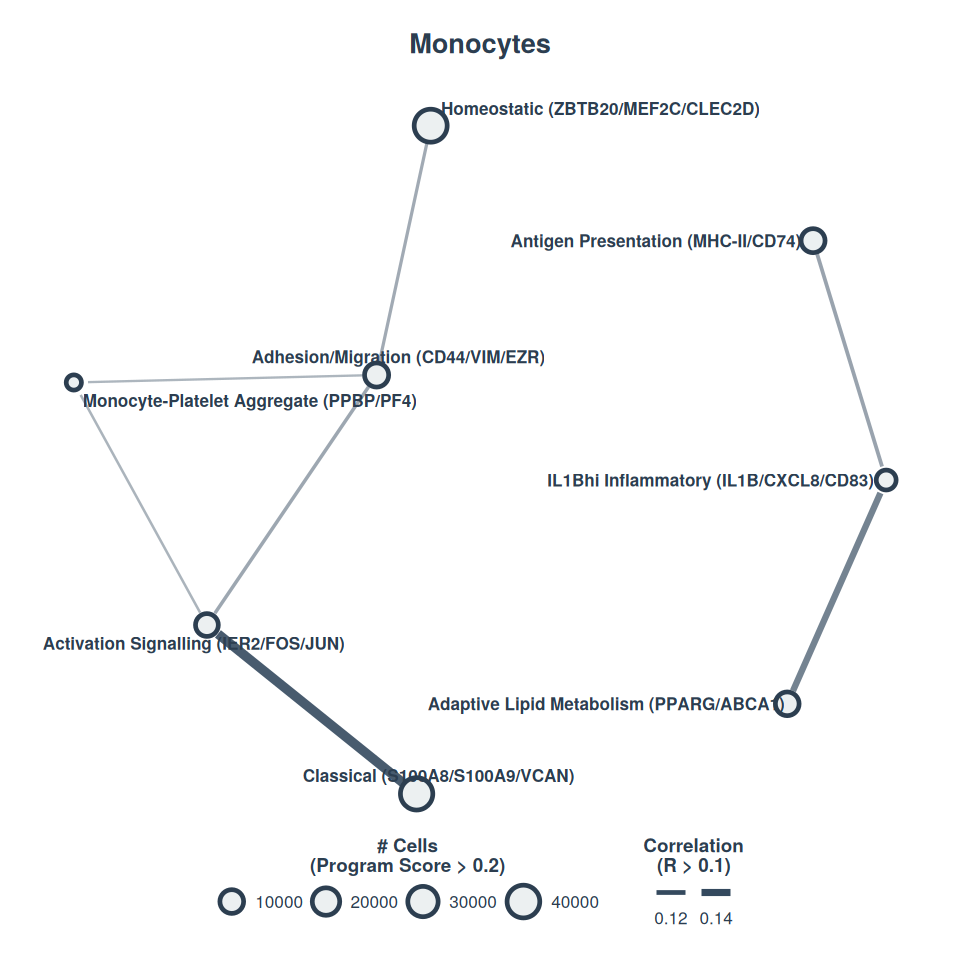

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

data <- t(GetAssayData(sub, assay = "GEP", layer = "data"))[, !grepl(pattern = "Housekeeping|Contamination|Artefactual", x = rownames(GetAssayData(sub, assay = "GEP", layer = "data")))]

set.seed(42)

gep.network.plot(
  data = data,
  usage.threshold = 0.2,
  min.correlation = 0.1,
  labs = list(title = "Monocytes")
)$plot

ggsave(
  filename = "../results/plots/mono_gep_network.pdf",
  width = 8,
  height = 8,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

## NK cells

In [55]:
# Subset to NK cells only
sub <- subset(seu, subset = cluster_main == "NK")
Idents(sub) <- "cluster_fine"

In [56]:
sub[["GEP"]] <- CreateAssayObject(data = gep.usage[["NK"]])

Warning message:
"Layer counts isn't present in the assay object; returning NULL"


### Compute UMAP projection

In [58]:
sub <- sub %>%
  RunUMAP(
    reduction = "integrated.rna",
    dims = 1:50,
    metric = "cosine",
    n.neighbors = 30L,
    min.dist = 0.3,
    spread = 1,
    n.epochs = 200L
  )

12:39:17 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

12:39:17 Read 29142 rows and found 50 numeric columns

12:39:17 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

12:39:17 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|



*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:39:21 Writing NN index file to temp file /tmp/RtmpjhACBG/file331ff44a41d5e6

12:39:21 Searching Annoy index using 1 thread, search_k = 3000

12:39:31 Annoy recall = 100%

12:39:34 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

12:39:37 Initializing from normalized Laplacian + noise (using RSpectra)

12:39:38 Commencing optimization for 200 epochs, with 1392198 positive edges

12:39:53 Optimization finished



### Visualise GEP usage

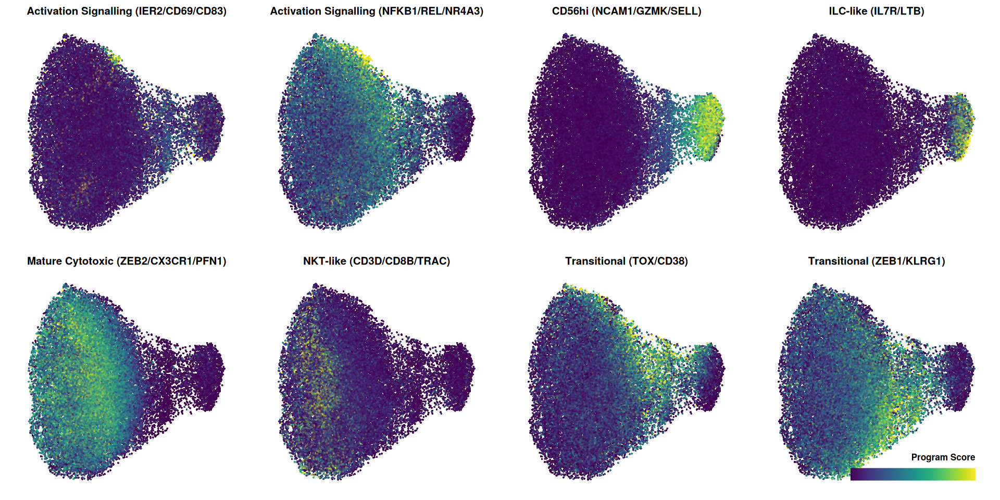

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 8)

plots <- expression.plot(
  sub,
  features = grep(pattern = "Housekeeping|Contamination|Artefactual", x = Features(sub[["GEP"]]), invert = TRUE, value = TRUE),
  assay = "GEP",
  verbose = FALSE,
  cmap = pals::viridis(100),
  limits = c(NA, "p99"),
  rasterise = TRUE,
  size.adj = 10,
  alpha = 1,
  pixels = c(2048, 2048)
) %>%
  lapply(
    function(x) {
      x +
        labs(colour = "Program Score") +
        theme(
          panel.border = element_blank(),
          axis.title = element_blank(),
          plot.title = element_text(size = 12, face = "bold", hjust = 0.5),
          legend.position = "none"
        )
    }
  )

plots <- plots[order(names(plots))]

plots[[length(plots)]] <- plots[[length(plots)]] +
  guides(
    color = guide_colorbar(direction = "horizontal", title.position = "top", barwidth = 10, barheight = 1, draw.ulim = FALSE, draw.llim = FALSE)
  ) +
  inset.legend(location = "bottomright") +
  theme(
    legend.ticks = element_blank(),
    legend.title = element_text(size = 10, face = "bold"),
    legend.text.position = "bottom"
  )

combined <- cowplot::plot_grid(plotlist = plots, ncol = 4)

combined

ggsave(
  plot = combined,
  filename = "../results/plots/nk_gep_umap.pdf",
  width = 16,
  height = 8,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

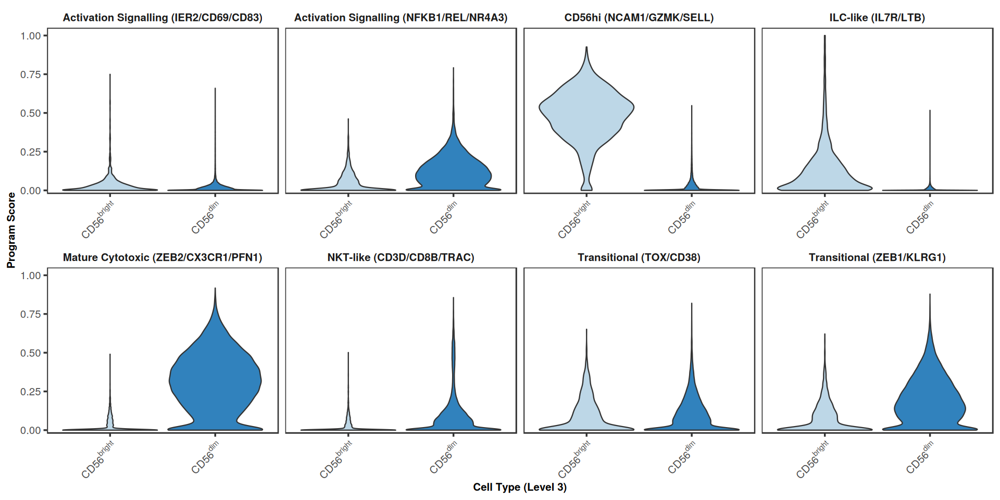

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 8)

data <- FetchData(sub, vars = c("donor", "cluster_coarse", "cluster_fine", paste0("gep_", Features(sub[["GEP"]])))) %>%
  rename_with(.cols = starts_with("gep_"), .fn = ~ gsub("gep_", "", .x)) %>%
  pivot_longer(cols = all_of(Features(sub[["GEP"]])), names_to = "gep", values_to = "usage") %>%
  filter(!grepl(pattern = "Housekeeping|Contamination|Artefactual", x = gep))

ggplot(data, aes(x = cluster_fine, y = usage, fill = cluster_coarse)) +
  geom_violin(scale = "width", alpha = 1) +
  facet_wrap(~gep, ncol = 4, scales = "free_x") +
  scale_fill_manual(values = cluster.pal) +
  scale_x_discrete(
    labels = function(x) {
      parse(
        text = case_match(
          x,
          "NK_CD56dim" ~ "CD56^dim",
          "NK_CD56bright" ~ "CD56^bright"
        )
      )
    }
  ) +
  scale_y_continuous(expand = expansion(mult = c(0.02, 0.05))) +
  labs(
    x = "Cell Type (Level 3)",
    y = "Program Score"
  ) +
  theme_custom() +
  theme(
    strip.background = element_blank(),
    strip.text = element_text(size = 12, face = "bold"),
    axis.title = element_text(size = 12, face = "bold"),
    axis.text.x = element_text(size = 12, angle = 45, hjust = 1, vjust = 1),
    axis.text.y = element_text(size = 12),
    legend.position = "none",
  )

ggsave(
  filename = "../results/plots/nk_gep_violin.pdf",
  width = 16,
  height = 8,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

### GEP co-expression

Removing 4 isolated nodes with no connections above threshold

Network contains 4 nodes and 2 edges



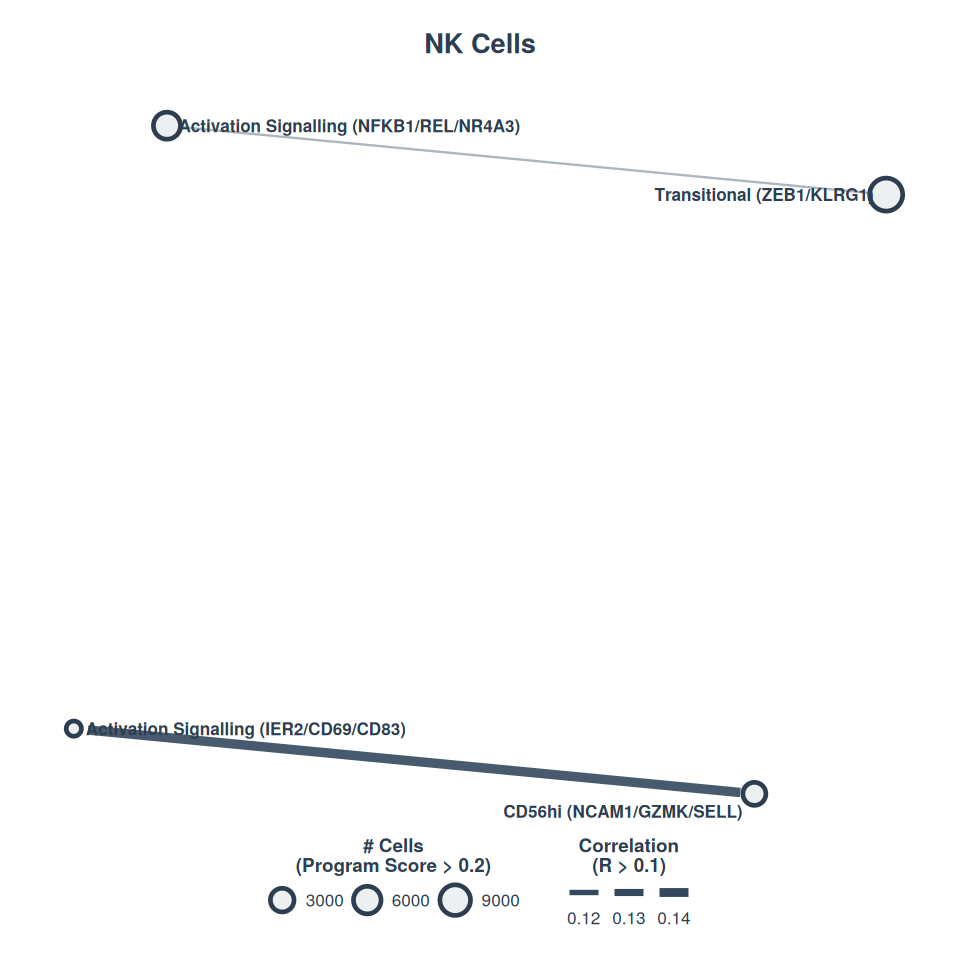

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

data <- t(GetAssayData(sub, assay = "GEP", layer = "data"))[, !grepl(pattern = "Housekeeping|Contamination|Artefactual", x = rownames(GetAssayData(sub, assay = "GEP", layer = "data")))]

set.seed(42)

gep.network.plot(
  data = data,
  usage.threshold = 0.2,
  min.correlation = 0.1,
  labs = list(title = "NK Cells")
)$plot

ggsave(
  filename = "../results/plots/nk_gep_network.pdf",
  width = 8,
  height = 8,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

## T cells

In [67]:
# Subset to T cells only
sub <- subset(seu, subset = cluster_main == "T")
Idents(sub) <- "cluster_fine"

In [68]:
sub[["GEP"]] <- CreateAssayObject(data = gep.usage[["T"]])

Warning message:
"Layer counts isn't present in the assay object; returning NULL"


### Compute UMAP projection

In [ ]:
sub <- sub %>%
  RunUMAP(
    reduction = "integrated.rna",
    dims = 1:50,
    metric = "cosine",
    n.neighbors = 30L,
    min.dist = 0.3,
    spread = 1,
    n.epochs = 200L
  )

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
15:33:56 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

15:33:56 Read 141535 rows and found 50 numeric columns

15:33:56 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

15:33:56 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|



15:34:15 Writing NN index file to temp file /tmp/Rtmp5USMEK/filec147e609e98e

15:34:15 Searching Annoy index using 1 thread, search_k = 3000

15:35:40 Annoy recall = 100%

15:35:41 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

15:35:48 Initializing from normalized Laplacian + noise (using RSpectra)

15:35:56 Commencing optimization for 200 epochs, with 6989686 positive edges

15:37:08 Optimization finished



### Visualise GEP usage

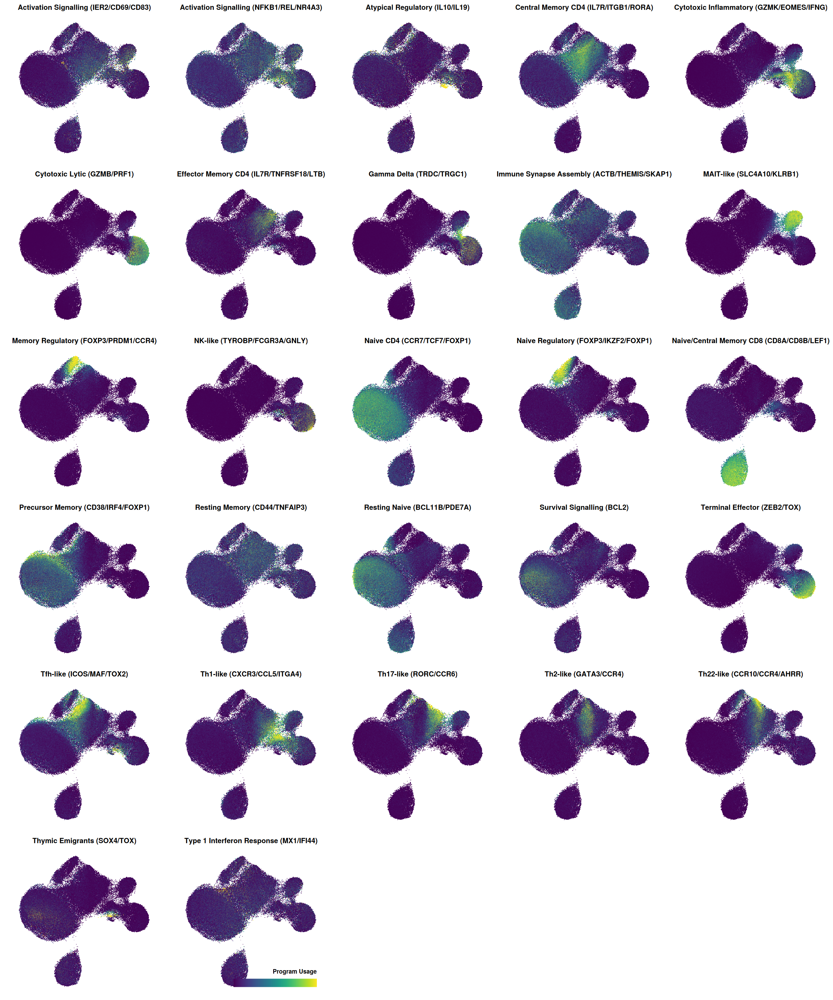

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 24)

plots <- expression.plot(
  sub,
  features = grep(pattern = "Housekeeping|Contamination|Artefactual", x = Features(sub[["GEP"]]), invert = TRUE, value = TRUE),
  assay = "GEP",
  verbose = FALSE,
  cmap = pals::viridis(100),
  limits = c(NA, "p99"),
  rasterise = TRUE,
  size.adj = 5,
  alpha = 1,
  pixels = c(2048, 2048)
) %>%
  lapply(
    function(x) {
      x +
        labs(colour = "Program Usage") +
        theme(
          panel.border = element_blank(),
          axis.title = element_blank(),
          plot.title = element_text(size = 12, face = "bold", hjust = 0.5),
          legend.position = "none"
        )
    }
  )

plots <- plots[order(names(plots))]

plots[[length(plots)]] <- plots[[length(plots)]] +
  guides(
    color = guide_colorbar(direction = "horizontal", title.position = "top", barwidth = 10, barheight = 1, draw.ulim = FALSE, draw.llim = FALSE)
  ) +
  inset.legend(location = "bottomright") +
  theme(
    legend.ticks = element_blank(),
    legend.title = element_text(size = 10, face = "bold"),
    legend.text.position = "bottom"
  )

combined <- cowplot::plot_grid(plotlist = plots, ncol = 5)

combined

ggsave(
  plot = combined,
  filename = "../results/plots/t_gep_umap.pdf",
  width = 20,
  height = 24,
  units = "in",
  dpi = 300
)

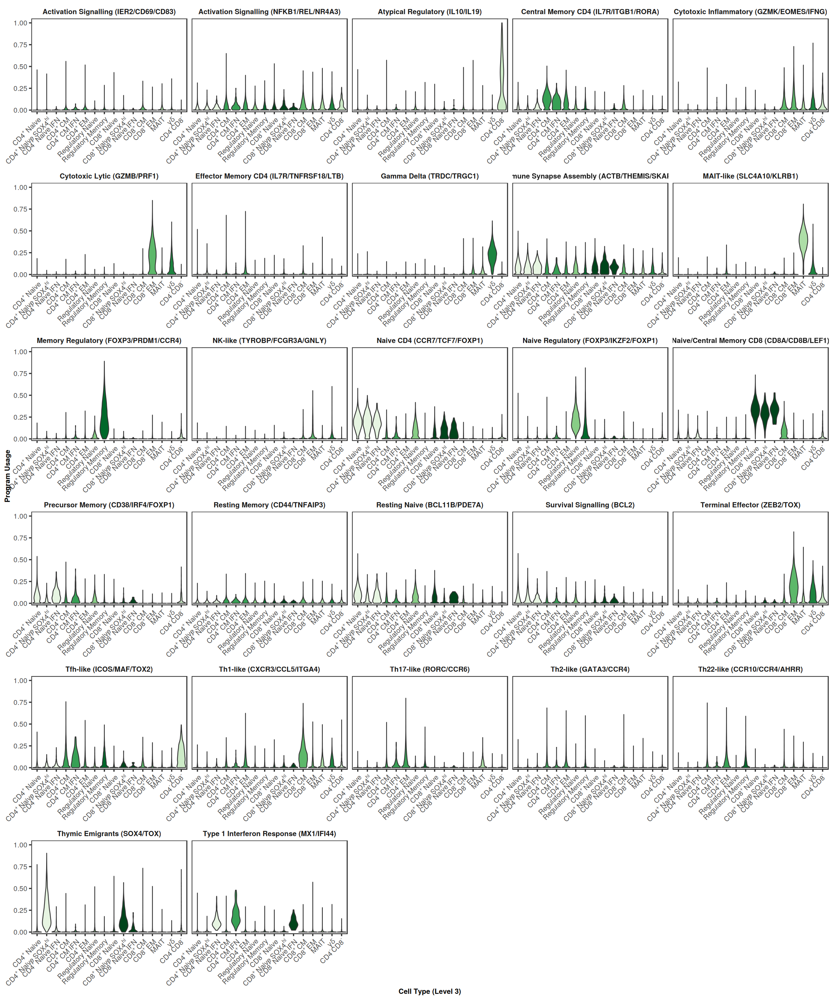

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 24)

data <- FetchData(sub, vars = c("donor", "cluster_coarse", "cluster_fine", paste0("gep_", Features(sub[["GEP"]])))) %>%
  rename_with(.cols = starts_with("gep_"), .fn = ~ gsub("gep_", "", .x)) %>%
  pivot_longer(cols = all_of(Features(sub[["GEP"]])), names_to = "gep", values_to = "usage") %>%
  filter(!grepl(pattern = "Housekeeping|Contamination|Artefactual", x = gep))

ggplot(data, aes(x = cluster_fine, y = usage, fill = cluster_coarse)) +
  geom_violin(scale = "width", alpha = 1) +
  facet_wrap(~gep, ncol = 5, scales = "free_x") +
  scale_fill_manual(values = cluster.pal) +
  scale_x_discrete(
    labels = function(x) {
      parse(
        text = case_match(
          x,
          "T_CD4_naive" ~ "CD4^'+'~Naive",
          "T_CD4_naive_SOX4" ~ "CD4^'+'~Naive~SOX4^hi",
          "T_CD4_naive_IFN" ~ "CD4^'+'~Naive~IFN",
          "T_CD4_memory_central" ~ "CD4^'+'~CM",
          "T_CD4_memory_central_IFN" ~ "CD4^'+'~CM~IFN",
          "T_CD4_memory_effector" ~ "CD4^'+'~EM",
          "T_regulatory_naive" ~ "Regulatory~Naive",
          "T_regulatory_memory" ~ "Regulatory~Memory",
          "T_CD8_naive" ~ "CD8^'+'~Naive",
          "T_CD8_naive_SOX4" ~ "CD8^'+'~Naive~SOX4^hi",
          "T_CD8_naive_IFN" ~ "CD8^'+'~Naive~IFN",
          "T_CD8_memory_central" ~ "CD8^'+'~CM",
          "T_CD8_memory_effector" ~ "CD8^'+'~EM",
          "T_MAIT" ~ "MAIT",
          "T_GD" ~ "gamma*delta",
          "T_DN" ~ "CD4^'-'*CD8^'-'"
        )
      )
    }
  ) +
  scale_y_continuous(expand = expansion(mult = c(0.02, 0.05))) +
  labs(
    x = "Cell Type (Level 3)",
    y = "Program Usage"
  ) +
  theme_custom() +
  theme(
    strip.background = element_blank(),
    strip.text = element_text(size = 12, face = "bold"),
    axis.title = element_text(size = 12, face = "bold"),
    axis.text.x = element_text(size = 12, angle = 45, hjust = 1, vjust = 1),
    axis.text.y = element_text(size = 12),
    legend.position = "none",
  )

ggsave(
  filename = "../results/plots/t_gep_violin.pdf",
  width = 20,
  height = 24,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

### GEP co-expression

Removing 3 isolated nodes with no connections above threshold

Network contains 24 nodes and 58 edges



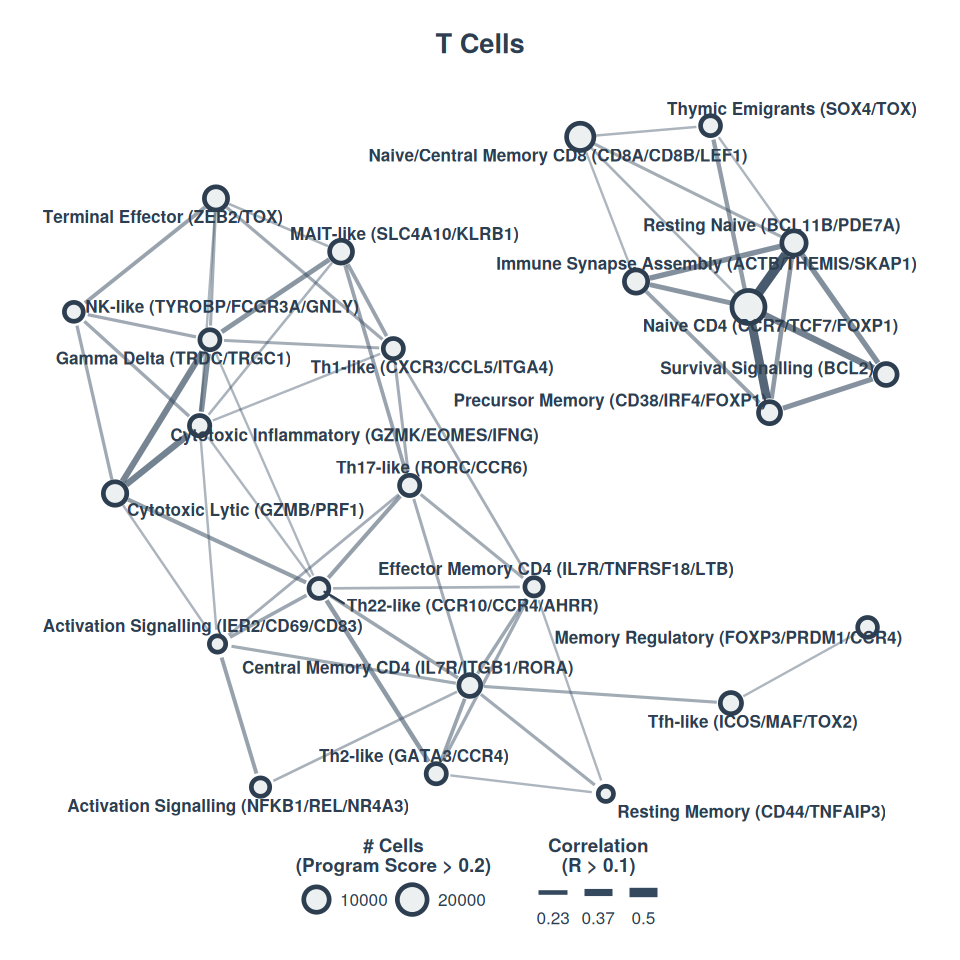

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

data <- t(GetAssayData(sub, assay = "GEP", layer = "data"))[, !grepl(pattern = "Housekeeping|Contamination|Artefactual", x = rownames(GetAssayData(sub, assay = "GEP", layer = "data")))]

set.seed(42)

gep.network.plot(
  data = data,
  usage.threshold = 0.2,
  min.correlation = 0.1,
  labs = list(title = "T Cells")
)$plot

ggsave(
  filename = "../results/plots/t_gep_network.pdf",
  width = 8,
  height = 8,
  units = "in",
  dpi = 300,
  device = cairo_pdf
)

# Session Info

In [80]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 22.04.5 LTS

Matrix products: default
BLAS/LAPACK: /ceph/project/fuggerlab/rfarooq/.conda/envs/sandbox/lib/libopenblasp-r0.3.28.so;  LAPACK version 3.12.0

locale:
[1] C

time zone: Europe/London
tzcode source: system (glibc)

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] ComplexHeatmap_2.18.0 cowplot_1.1.3         patchwork_1.3.0      
 [4] lubridate_1.9.3       forcats_1.0.0         stringr_1.5.1        
 [7] dplyr_1.1.4           purrr_1.0.2           readr_2.1.5          
[10] tidyr_1.3.1           tibble_3.2.1          ggplot2_3.5.1        
[13] tidyverse_2.0.0       Seurat_5.1.0          SeuratObject_5.0.2   
[16] sp_2.1-4             

loaded via a namespace (and not attached):
  [1] RcppAnnoy_0.0.22       splines_4.3.3          later_1.3.2           
  [4] pbdZMQ_0.3-13          polyclip_1.1